In [2]:
%load_ext autoreload
%autoreload 2

import pickle

import jax
import jaxopt
import jax.nn as jnn
import jax.numpy as jnp
import jax.scipy as jsp
from functools import partial

import time as tt
import numpy as np
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 18

import os
import corner
import numpy as np
import multiprocessing as mp

from potentials import *
from integrants_with_binning import *
from ghMoments import *
from utils import *
from constants import EPSILON

from potentials import NFW_acceleration
from densities import MiyamotoNagai_density

from likelihoods import mapping_norm_to_scale_uniform

from CylindricalSpline import get_phi_m, get_acc, evaluate_phi_axisymmetric

# path = '/home/hz420/python_script/SchwarMAX/'
# path = '/Users/hanyuan/Dropbox/python_script/SchwarMAX/'
# path = '/data/hz420-2/SchwarMAX/'

Best-fit parameters:
logM_halo: 12.0271
logM_disk: 10.6647
logM_bar: 9.8913
logRs_halo: 1.3251
logRs_disk: 0.6249
logHs_disk: -0.2679
logL_bar: 0.3215
$\alpha$: 35.5677
$\beta$: 20.4345
$\gamma$: 132.6197
$L/M$: 1.4425
$\Omega$: 34.6380


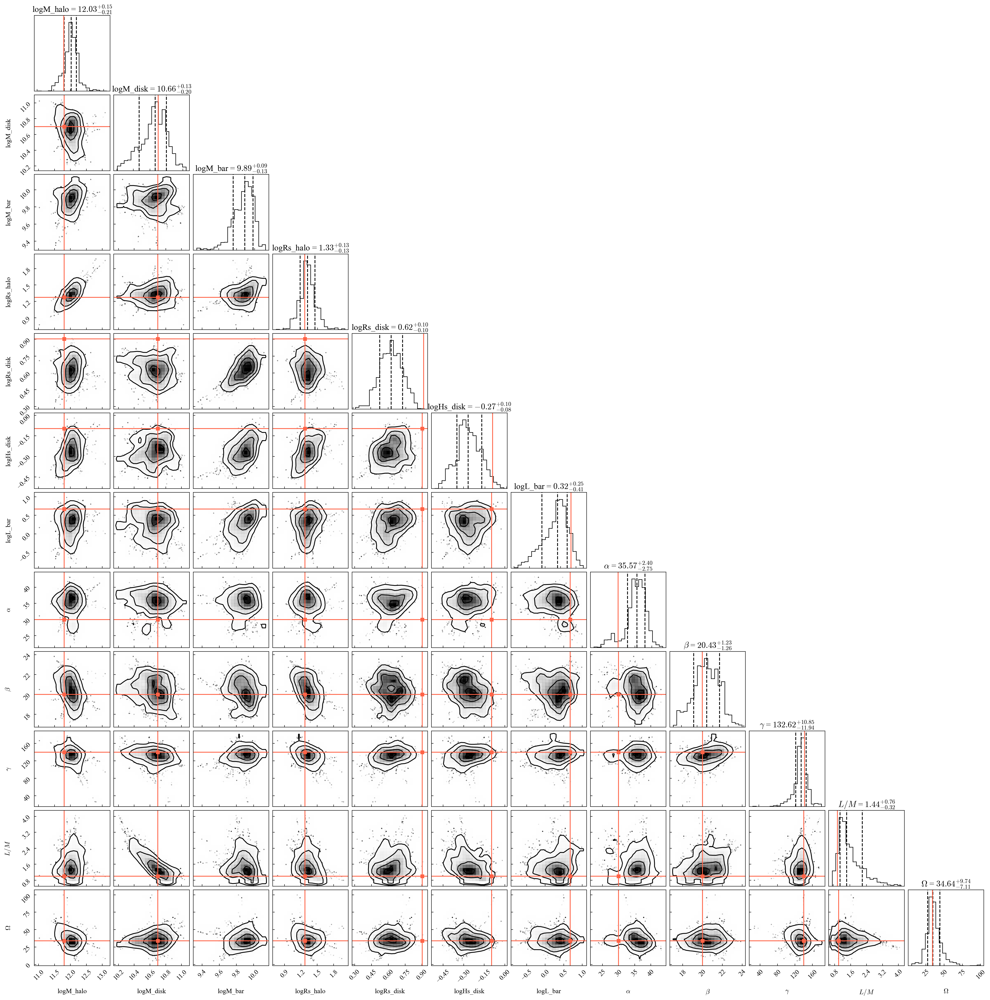

In [27]:
import emcee
import pandas as pd
import corner

# param_names = ['logM_halo', 'logM_disk', 'logRs_halo', 'logRs_disk', 'logHs_disk', r'$\alpha$', r'$\beta$', r'$\gamma$', '$L/M$']
param_names = ['logM_halo', 'logM_disk', 'logM_bar', 'logRs_halo', 'logRs_disk', 'logHs_disk', 'logL_bar', r'$\alpha$', r'$\beta$', r'$\gamma$', '$L/M$', r'$\Omega$']

PATH_DATA = '/home/hz420/python_script/SchwarMAX/'

# with open(PATH_DATA + '/mock_axisymmetric_disc_XY_withRot.pkl', 'rb') as f:
#     mock_data = pickle.load(f)

# with open(PATH_DATA + '/mock_axisymmetric_disc_potential_params.pkl', 'rb') as f:
#     gt_params = pickle.load(f)

# ground_truth = {
#         'logM_halo': gt_params['halo_params']['logM'].item(),
#         'logM_disk': gt_params['disc_params']['logM'].item(),
#         'logRs_halo': jnp.log10(gt_params['halo_params']['sbcaleRadius']).item(),
#         'logRs_disk': jnp.log10(gt_params['disc_params']['scaleRadius']).item(),
#         'logHs_disk': jnp.log10(gt_params['disc_params']['scaleHeight']).item(),
#         r'$\alpha$': mock_data['orientation'][0],
#         r'$\beta$': mock_data['orientation'][1],
#         r'$\gamma$': mock_data['orientation'][2],
#         '$L/M$': 1
# }

# with open(PATH_DATA + '/mock_axisymmetric_disc_potential_params.pkl', 'rb') as f:
#     gt_params = pickle.load(f)
    
ground_truth = {
        'logM_halo': 11.8,
        'logM_disk': 10.7,
        'logM_bar': 10.2,
        'logRs_halo': jnp.log10(18.8).item(),
        'logRs_disk': jnp.log10(8.0).item(),
        'logHs_disk': jnp.log10(0.8).item(),
        'logL_bar': jnp.log10(4.7).item(),
        r'$\alpha$': 30,
        r'$\beta$': 20,
        r'$\gamma$': 140,
        '$L/M$': 1.,
        r'$\Omega$': 34.0
}


data_folder = '/Users/hanyuan/Desktop/PhD_projects/SchwarMAX_data'
# data_folder = '/data/hz420-2/SchwarMAX'
fig, ax = plt.subplots(12, 12, figsize=(25, 25))
# posterior = pd.read_csv(data_folder + '/test_posterior_0225.csv').to_numpy()
# with open(data_folder + '/test_posterior_WholeChain_0225.pkl', 'rb') as f:
#     wholechain = pickle.load(f)
# posterior = wholechain[80:, :, :]
# posterior = posterior.reshape(-1, posterior.shape[-1])
reader = emcee.backends.HDFBackend(data_folder + '/backend_0319.csv', read_only=True)
wholechain = reader.get_chain(discard=0, flat=False)
logprob = reader.get_log_prob(discard=0, flat=False)
posterior = wholechain[50:, (np.isfinite(logprob[-1, :]) & np.isfinite(logprob[50, :])), :]
posterior = posterior.reshape(-1, posterior.shape[-1])

samples_plot = np.zeros((posterior.shape[0], len(param_names)))
samples_plot[:,0] = posterior[:,0]
samples_plot[:,1] = posterior[:,1]
samples_plot[:,2] = posterior[:,2]
samples_plot[:,3] = posterior[:,3]
samples_plot[:,4] = posterior[:,4]
samples_plot[:,5] = posterior[:,5]
samples_plot[:,6] = posterior[:,6]
samples_plot[:,7] = posterior[:,7] * 180/np.pi
samples_plot[:,8] = posterior[:,8] * 180/np.pi
samples_plot[:,9] = posterior[:,9] * 180/np.pi
samples_plot[:,10] = 10 ** posterior[:,10]
samples_plot[:,11] = 10 ** posterior[:,11]# / KPCGYR_TO_KMS**2


ground_truth_plot = [ground_truth[k] for k in param_names]
corner.corner(samples_plot, labels=param_names, truths=ground_truth_plot, 
              show_titles=True, title_fmt='.2f', title_kwargs={"fontsize": 15},
              smooth=True, truth_color='tomato', quantiles=[0.16, 0.5, 0.84], fig=fig)

best_fit_param = np.percentile(samples_plot, 50, axis=0)
print("Best-fit parameters:")
for i, name in enumerate(param_names):
    print(f"{name}: {best_fit_param[i]:.4f}")

# fig.savefig(data_folder + '/plots/Mock_axisymmetric_disc_posterior_0225.png', dpi=300)
plt.show()

best-fit logL -40.357112884521484
best-fit param [11.95431756 10.69145899  9.9736901   1.27928057  0.67681425 -0.24714738
  0.30013275  0.62120957  0.36488215  2.43649044  0.11574515  1.64906533]
logM_halo: 11.9543
10^logM_halo: 900155550285.7781
logM_disk: 10.6915
10^logM_disk: 49142697248.143974
logM_bar: 9.9737
10^logM_bar: 9412177285.820812
logRs_halo: 1.2793
10^logRs_halo: 19.02306848155956
logRs_disk: 0.6768
10^logRs_disk: 4.7513197056022785
logHs_disk: -0.2471
10^logHs_disk: 0.5660471680322878
logRs_bar: 0.3001
10^logRs_bar: 1.9958722892848089
$\alpha$: 0.6212
best-fit $\alpha$: 35.59268655405203
$\beta$: 0.3649
best-fit $\beta$: 20.906207038752765
$\gamma$: 2.4365
best-fit $\gamma$: 139.6006189119736
$log(L/M)$: 0.1157
10^$log(L/M)$: 1.3054046362492542
$log(\Omega)$: 1.6491
10^$log(\Omega)$: 44.57232951346665


100%|██████████| 12/12 [00:00<00:00, 164.91it/s]


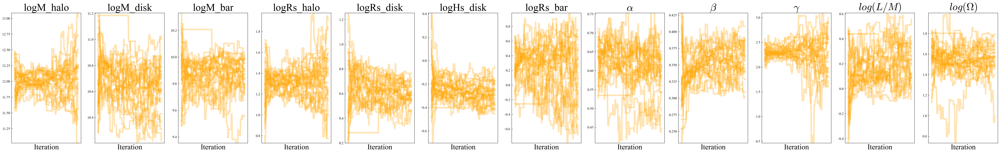

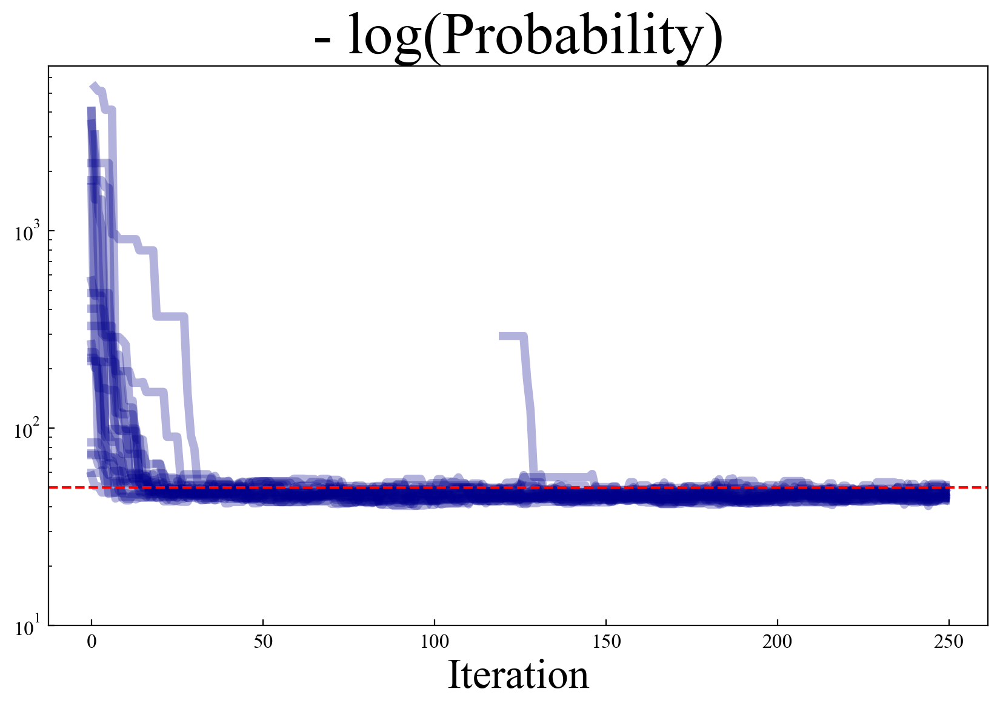

Maximum log probability: -40.357112884521484


In [26]:
param_names = ['logM_halo', 'logM_disk', 'logM_bar', 'logRs_halo', 'logRs_disk', 'logHs_disk', 'logRs_bar', r'$\alpha$', r'$\beta$', r'$\gamma$', r'$log(L/M)$', r'$log(\Omega)$']

data_folder = '/Users/hanyuan/Desktop/PhD_projects/SchwarMAX_data'
# with open(data_folder + '/test_posterior_WholeChain_0225.pkl', 'rb') as f:
#     posterior = pickle.load(f)
# with open(data_folder + '/test_posterior_logprob_0225.pkl', 'rb') as f:
#     logprob = pickle.load(f)
reader = emcee.backends.HDFBackend(data_folder + '/backend_0319.csv', read_only=True)
posterior = reader.get_chain(discard=0, flat=False)
logprob = reader.get_log_prob(discard=0, flat=False)

params_chain = posterior.reshape(-1, posterior.shape[-1])
best_logL = np.amax((logprob.flatten()))
best_param = params_chain[np.argmax(logprob.flatten())]
print('best-fit logL', best_logL)
print('best-fit param', best_param)
for i, name in enumerate(param_names):
    print(f"{name}: {best_param[i]:.4f}")
    if 'log' in name:
        print(f'10^{name}:', 10**best_param[i])
    else:
        print(f'best-fit {name}:', best_param[i] * 180 / np.pi)

# param_names = ['logM_halo', 'logM_disk', 'logRs_halo', 'logRs_disk', 'logHs_disk', r'$\alpha$', r'$\beta$', r'$\gamma$', r'$log(L/M)$']
fig, ax = plt.subplots(1, posterior.shape[2], figsize=(5*posterior.shape[2], 8), gridspec_kw={'hspace': 0.1})
# posterior.shape
for i in tqdm(range(posterior.shape[2])):

    ylims = np.percentile(posterior[:,:,i].flatten(), [0.01, 99.99])

    ax[i].set_title(f'{param_names[i]}', fontsize=35)
    for j in range(posterior.shape[1]):
        ax[i].plot(posterior[:,j,i], lw = 5, rasterized=True, alpha = 0.3, color = 'orange')
        ax[i].set(xticks=[], ylim=ylims)
        if j == posterior.shape[1] - 1:
            ax[i].set_xlabel('Iteration', fontsize=25)

fig1, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(-logprob, lw=5, color='darkblue', alpha = 0.3, rasterized=True)
# ax1.set_ylim
ax1.axhline(50, color='red', ls='--')
ax1.set_title('- log(Probability)', fontsize=35)
ax1.set_xlabel('Iteration', fontsize=25)
ax1.set(yscale = 'log', ylim = [10, None])
plt.show()

print('Maximum log probability:', np.amax(logprob))

In [51]:
# param_names = ['logM_halo', 'logM_disk',  'logRs_halo', 'logRs_disk', 'logHs_disk', r'$\alpha$', r'$\beta$', r'$\gamma$', 'log_light_to_mass_ratio']
param_names = ['logM_halo', 'logM_disk', 'logM_bulge', 'logRs_halo', 'logRs_disk', 'logHs_disk', 'logRs_bulge', r'$\alpha$', r'$\beta$', r'$\gamma$', 'log_light_to_mass_ratio']


ground_truth = {
        'logM_halo': 11.9,
        'logM_disk': 8.83,
        'logM_bulge': 10.4,
        'logRs_halo': jnp.log10(20.8).item(),
        'logRs_disk': jnp.log10(2.81).item(),
        'logHs_disk': jnp.log10(0.70).item(),
        'logRs_bulge': jnp.log10(0.70).item(),
        r'$\alpha$': 30,
        r'$\beta$': 20,
        r'$\gamma$': 0,
        'log_light_to_mass_ratio': 0
}

# data_folder = '/data/hz420-2/SchwarMAX'
data_folder = '/Users/hanyuan/Desktop/PhD_projects/SchwarMAX_data'
df_param = pd.read_csv(data_folder+'/grid_search_result_0302.csv')
df_param = df_param[df_param['log_prob'] > np.percentile(df_param['log_prob'], 90)]
df_param = df_param[np.isfinite(df_param['log_prob'])]

samples_plot = np.zeros((df_param.shape[0], len(param_names)))
samples_plot[:,0] = df_param['logM_halo'].to_numpy()
samples_plot[:,1] = df_param['logM_disk'].to_numpy()
samples_plot[:,2] = df_param['logM_bulge'].to_numpy()
samples_plot[:,3] = df_param['logRs_halo']
samples_plot[:,4] = df_param['logRs_disk']
samples_plot[:,5] = df_param['logHs_disk']
samples_plot[:,6] = df_param['logRs_bulge']
samples_plot[:,7] = df_param['alpha'] * 180/np.pi
samples_plot[:,8] = df_param['beta'] * 180/np.pi
samples_plot[:,9] = df_param['gamma'] * 180/np.pi
samples_plot[:,10] = df_param['log_light_to_mass_ratio']

fig, ax = plt.subplots(len(param_names), len(param_names), figsize = (6* len(param_names), 6* len(param_names)),
                       gridspec_kw={'hspace': 0.5, 'wspace': 0.5})

for j in range (len(param_names)):
  for i in range (len(param_names)):

    if i>j:
      xedge = np.linspace(np.amin(samples_plot[:,j]), np.amax(samples_plot[:,j]), 15)
      yedge = np.linspace(np.amin(samples_plot[:,i]), np.amax(samples_plot[:,i]), 15)
      xmid, ymid = (xedge[1:]+xedge[:-1])/2, (yedge[1:]+yedge[:-1])/2
      H, xedge, yedge = np.histogram2d(samples_plot[:,j], samples_plot[:,i], bins = [xedge, yedge])
      H_val = np.histogram2d(samples_plot[:,j], samples_plot[:,i], bins = [xedge, yedge], weights = df_param['log_prob'])[0] / (H)
      # cb = ax[i,j].scatter(df_param[param_names[i]], df_param[param_names[j]], c=df_param['log_prob'], cmap='viridis',vmin=-3e3)
      cb = ax[i,j].pcolormesh(xedge, yedge, H_val.T, cmap='viridis', )
      # ax[i,j].contour(xmid, ymid, H_val.T, levels = [-3000,-2000,-1000,-500])
      ax[i,j].set_xlabel(param_names[j])
      ax[i,j].set_ylabel(param_names[i])
      ax[i,j].axvline(x=ground_truth[param_names[j]], color='red')
      ax[i,j].axhline(y=ground_truth[param_names[i]], color='red')
      ax[i,j].scatter(ground_truth[param_names[j]], ground_truth[param_names[i]], color='red', marker='s', s=50)
      fig.colorbar(cb, ax = ax[i,j])

    elif i<j:
      ax[i,j].set_axis_off()

    else:
      ax[i,j].scatter(samples_plot[:,i], df_param['log_prob'], c=df_param['log_prob'], cmap='viridis')
      ax[i,j].set_xlabel(param_names[i])
      ax[i,j].set_ylabel('log_prob')
      ax[i,j].axvline(x=ground_truth[param_names[i]], color='red')
      ax[i,j].set(ylim=[-2e3/4 , 0])

/var/folders/sy/hx8cmv810rq7tfr6nkmnhg3w0000gn/T/ipykernel_8944/2455600919.py:49: RuntimeWarning: invalid value encountered in divide
  H_val = np.histogram2d(samples_plot[:,j], samples_plot[:,i], bins = [xedge, yedge], weights = df_param['log_prob'])[0] / (H)


In [82]:
df_param = pd.read_csv(data_folder+'/grid_search_result_0209.csv')

d_param = np.zeros((df_param.shape[0], len(param_names)))
d_param[:,0] = df_param['logM_halo'].to_numpy() - ground_truth['logM_halo']
d_param[:,1] = df_param['logM_disk'].to_numpy() - ground_truth['logM_disk']
d_param[:,2] = df_param['logRs_halo'].to_numpy() - ground_truth['logRs_halo']
d_param[:,3] = df_param['logRs_disk'].to_numpy() - ground_truth['logRs_disk']
d_param[:,4] = df_param['logHs_disk'].to_numpy() - ground_truth['logHs_disk']
d_param[:,5] = ((df_param['alpha']) - (ground_truth[r'$\alpha$'] * np.pi/180)) * 5
d_param[:,6] = ((df_param['beta']) - (ground_truth[r'$\beta$'] * np.pi/180)) * 5
d_param[:,7] = ((df_param['gamma']) - (ground_truth[r'$\gamma$'] * np.pi/180)) * 5

d_all = np.sqrt(np.sum(d_param**2, axis=1))
best_idx = np.argmin(d_all)
print("Best-fit parameters:")
# for i, name in enumerate(param_names):
    # print(f"{name}: {samples_plot[best_idx, i]:.4f}")
print('logM_halo:', df_param['logM_halo'].iloc[best_idx])
print('logM_disk:', df_param['logM_disk'].iloc[best_idx])
print('logRs_halo:', df_param['logRs_halo'].iloc[best_idx])
print('logRs_disk:', df_param['logRs_disk'].iloc[best_idx])
print('logHs_disk:', df_param['logHs_disk'].iloc[best_idx])
print('alpha (deg):', df_param['alpha'].iloc[best_idx])
print('beta (deg):', df_param['beta'].iloc[best_idx])
print('gamma (deg):', df_param['gamma'].iloc[best_idx])

Best-fit parameters:
logM_halo: 11.59350125433602
logM_disk: 12.418466241327964
logRs_halo: 2.1409350633621216
logRs_disk: 0.7388400137424469
logHs_disk: -0.1330612599849701
alpha (deg): 0.5276893910326605
beta (deg): 0.2822524649709579
gamma (deg): -0.3558835427894687


# Model to data comparison

In [1]:
from model_bar import * 
from sample_from_density import sample_from_density_grid
from likelihoods_bar import logl_density
import emcee


import pickle

import jax
import jaxopt
import jax.nn as jnn
import jax.numpy as jnp
import jax.scipy as jsp
from functools import partial

import time as tt
import numpy as np
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 18

import os
import corner
import numpy as np
import multiprocessing as mp

from potentials import *
from integrants_with_binning import *
from ghMoments import *
from utils import *
from constants import EPSILON

from potentials import NFW_acceleration
from densities import MiyamotoNagai_density

from CylindricalSpline import get_phi_m, get_acc, evaluate_phi_axisymmetric

import agama
agama.setUnits(length=1, velocity=1, mass=1)

def get_dict_data(path):

    with open(path + 'mock_Nbody_bar_XY_withRot.pkl', 'rb') as f:
        bin_dict = pickle.load(f)

    # voronoi binning mapping and data
    num_per_bin = jnp.array(bin_dict['num_per_bin'])
    total_bins = jnp.array(bin_dict['total_bins'])
    bin_mapping = jnp.array(bin_dict['bin_mapping'])
    surface_density = jnp.array(bin_dict['surface_density'])
    V_data = jnp.array(bin_dict['V_mean'])
    sigma_data = jnp.array(bin_dict['V_sigma'])
    h1_data = jnp.array(bin_dict['h1'])
    h2_data = jnp.array(bin_dict['h2'])
    h3_data = jnp.array(bin_dict['h3'])
    h4_data = jnp.array(bin_dict['h4'])
    v0 = jnp.array(bin_dict['v0'])
    s = jnp.array(bin_dict['s'])
    alpha, beta, gamma = bin_dict['orientation']

    # V_data_err = jnp.where(0.1 * jnp.fabs(V_data) < 10, 10, 0.1 * V_data)
    # sigma_data_err = jnp.where(0.1 * jnp.fabs(sigma_data) < 5, 5, 0.1 * sigma_data)
    # h1_data_err = jnp.where(0.1 * jnp.fabs(h1_data) < 0.03, 0.03, 0.1 * jnp.fabs(h1_data))
    # h2_data_err = jnp.where(0.1 * jnp.fabs(h2_data) < 0.03, 0.03, 0.1 * jnp.fabs(h2_data))
    # h3_data_err = jnp.where(0.1 * jnp.fabs(h3_data) < 0.03, 0.03, 0.1 * jnp.fabs(h3_data))
    # h4_data_err = jnp.where(0.1 * jnp.fabs(h4_data) < 0.03, 0.03, 0.1 * jnp.fabs(h4_data))
    V_data_err = jnp.array(bin_dict['V_mean_err'])
    sigma_data_err = jnp.array(bin_dict['V_sigma_err'])
    h1_data_err = jnp.array(bin_dict['h1_err'])
    h2_data_err = jnp.array(bin_dict['h2_err'])
    h3_data_err = jnp.array(bin_dict['h3_err'])
    h4_data_err = jnp.array(bin_dict['h4_err'])

    # df_Rzphi_data = pd.read_csv(path + 'mock_axisymmetric_disc_Rzphi.csv')
    # Rzphi_density_data = jnp.array(df_Rzphi_data['mass'].to_numpy()).astype(jnp.float32)
    with open(path + 'mock_axisymmetric_disc_Rzphi.pkl', 'rb') as f:
        Rzphi_density_data = pickle.load(f)

    R_grid, z_grid, phi_grid = Rzphi_density_data['R_grid'], Rzphi_density_data['z_grid'], Rzphi_density_data['phi_grid']
    dR = np.unique(R_grid)[1] - np.unique(R_grid)[0]
    dz = np.unique(z_grid)[1] - np.unique(z_grid)[0]
    dphi = np.unique(phi_grid)[1] - np.unique(phi_grid)[0]
    sample_for_integration = Rzphi_density_data['sample_for_integration']

    from scipy.stats import qmc
    X_regular_grid, Y_regular_grid = bin_dict['X_regular_grid'], bin_dict['Y_regular_grid']
    dX = jnp.unique(X_regular_grid)[1] - jnp.unique(X_regular_grid)[0]
    dY = jnp.unique(Y_regular_grid)[1] - jnp.unique(Y_regular_grid)[0]
    sampler = qmc.Sobol(d=3, scramble=False)
    sample = sampler.random_base2(m=10)

    n_samples = 5_000  # Same number as original data
    x_grid = np.linspace(0, 15, 1000)
    logP_xexp = XexpX_pdf_log(x_grid, 4.0)
    key = jax.random.PRNGKey(10086)
    R_samples = sample_from_logP(x_grid, logP_xexp, n_samples, key)
    phi_samples = np.random.uniform(0, 2*np.pi, size=n_samples)

    x_samples, y_samples = R_samples * np.cos(phi_samples), R_samples * np.sin(phi_samples)

    x_grid = np.linspace(0, 4, 1000)
    logP_exp = expX_pdf_log(x_grid, 1.5)
    key = jax.random.PRNGKey(10010)
    z_samples = sample_from_logP(x_grid, logP_exp, n_samples, key)
    w0 = np.array([
        x_samples,
        y_samples,
        z_samples,
    ]).T

    dict_data = {
        'v0': v0,
        's': s,

        # 'Rzphi_density_data': Rzphi_density_data,
        'XY_density_data': surface_density,
        'V_data': V_data,
        'V_data_err': V_data_err,
        'sigma_data': sigma_data,
        'sigma_data_err': sigma_data_err,
        'h1_data': h1_data,
        'h1_data_err': h1_data_err,
        'h2_data': h2_data,
        'h2_data_err': h2_data_err,
        'h3_data': h3_data,
        'h3_data_err': h3_data_err,
        'h4_data': h4_data,
        'h4_data_err': h4_data_err,
        'num_per_bin': num_per_bin,
        'bin_mapping': bin_mapping,
        'total_bins': total_bins.item(),

        'R_grid': R_grid,
        'z_grid': z_grid,
        'phi_grid': phi_grid,
        'dR': dR,
        'dz': dz,
        'dphi': dphi,
        'sample_for_integration': sample_for_integration,

        'X_regular_grid': X_regular_grid,
        'Y_regular_grid': Y_regular_grid,
        'dX': dX,
        'dY': dY,
        'sample_for_integration_XY': sample,

        'w0': w0
    }

    return dict_data

In [8]:
data_folder = '/Users/hanyuan/Desktop/PhD_projects/SchwarMAX_data'
path = '/Users/hanyuan/Dropbox/python_script/SchwarMAX/'
dict_data = get_dict_data(path)

param_names = ['logM_halo', 'logM_disk', 'logM_bar', 'logRs_halo', 'logRs_disk', 'logHs_disk', 'logRs_bar', r'$\alpha$', r'$\beta$', r'$\gamma$', r'$\log_{10}(L/M)$', r'$\log_{10}(\Omega)$']


reader = emcee.backends.HDFBackend(data_folder + '/backend_0318.csv', read_only=True)
wholechain = reader.get_chain(discard=0, flat=False)
logprob = reader.get_log_prob(discard=0, flat=False)
posterior = wholechain[50:, (np.isfinite(logprob[-1, :]) & np.isfinite(logprob[-50, :])), :]
posterior = posterior.reshape(-1, posterior.shape[-1])

best_fit_param = np.percentile(posterior, 50, axis=0)
print("Best-fit parameters:")
for i, name in enumerate(param_names):
    print(f"{name}: {best_fit_param[i]:.4f}")

dict_data['logl_density_max'] = -0.24
logMhalo_best_fit, logMdisk_best_fit, logMbar_best_fit, logRh_halo_best_fit, logRs_disk_best_fit, logHs_disk_best_fit, logRs_bar_best_fit,\
      alpha_best_fit, beta_best_fit, gamma_best_fit, logLM_best_fit, logOmega_best_fit = best_fit_param

alpha = alpha_best_fit * 180/np.pi
beta = beta_best_fit * 180/np.pi
gamma = gamma_best_fit * 180/np.pi# gamma_best_fit
ground_truth = [logMhalo_best_fit,
                logMdisk_best_fit,
                logMbar_best_fit,
                logRh_halo_best_fit,
                logRs_disk_best_fit,
                logHs_disk_best_fit,
                logRs_bar_best_fit,   
                alpha,
                beta,
                gamma,
                logLM_best_fit,
                # 0.,
                logOmega_best_fit,
                # 1.5
]
# ground_truth = [logMhalo_best_fit,
#                 8.6,
#                 10.4,
#                 logRh_halo_best_fit,
#                 logRs_disk_best_fit,
#                 logHs_disk_best_fit,
#                 logRs_bar_best_fit,   
#                 alpha,
#                 beta,
#                 gamma,
#                 # logLM_best_fit,
#                 0.0,
#                 # logOmega_best_fit,
#                 1.6
# ]

params_halo_pot = {
    'logM': ground_truth[0],
    'Rs':10 ** ground_truth[3],
    'a':1.0,
    'b':1.0,
    'c':1.0,
    'x_origin':0.0,
    'y_origin':0.0,
    'z_origin':0.0,
    'dirx':0.0,
    'diry':0.0,
    'dirz':1.0
}

params_disk_rho = {
    'logM_disc': ground_truth[1],
    'Rs_disc': 10 ** ground_truth[4],
    'Hs_disc': 10 ** ground_truth[5],
    'x_origin': 0.0,
    'y_origin': 0.0,
    'z_origin': 0.0,
    'dirx': 0.0,
    'diry': 0.0,
    'dirz': 1.0,
    'alpha': ground_truth[7],
    'beta': ground_truth[8],
    'gamma': ground_truth[9],
    'logM_bar': ground_truth[2],
    'L_bar': 10 ** ground_truth[6],
    'a_bar': 10 ** ground_truth[6] / 5,
    'b_bar': 10 ** ground_truth[5],
    'light_to_mass_ratio': 10 ** ground_truth[10],
    'Omega_bar': 10 ** ground_truth[11],
}

surface_density_model = projection(params_disk_rho, dict_data, dict_data['total_bins'])
surface_density_gt = dict_data['XY_density_data'] / params_disk_rho['light_to_mass_ratio']

chi2 = jnp.sum((surface_density_gt - surface_density_model)**2 / (0.1 * surface_density_gt)**2)
_logl_density = -0.5 * chi2 / dict_data['total_bins']
print(_logl_density)

density_set, V_model, sigma_model, h1_set, h2_set, h3_set, h4_set,\
        density_unity_set, _V_model_unity, _sigma_model_unity, h1_unity_set, h2_unity_set, h3_unity_set, h4_unity_set,\
              weights = model_for_plotting(params_halo_pot, params_disk_rho, dict_data, dict_data['total_bins'])
V_model.block_until_ready()
print('Model Done')


density_2DXY, y_xy, sig_xy = density_set
h1_model, y_h1, sig_A1 = h1_set
h2_model, y_h2, sig_A2 = h2_set
h3_model, y_h3, sig_A3 = h3_set
h4_model, y_h4, sig_A4 = h4_set

# V_model = jnp.where(jnp.isnan(V_model), 0.0, V_model)
# sigma_model = jnp.where(jnp.isnan(sigma_model), 0.0, sigma_model)
h3_model = jnp.where(jnp.isnan(h3_model), 0.0, h3_model)
h4_model = jnp.where(jnp.isnan(h4_model), 0.0, h4_model)
h1_data, h1_data_err = y_h1, sig_A1
h2_data, h2_data_err = y_h2, sig_A2
h3_data, h3_data_err = y_h3, sig_A3
h4_data, h4_data_err = y_h4, sig_A4

res_density = ((density_2DXY - y_xy) / (sig_xy + EPSILON))**2
res_h1 = ((h1_model - h1_data) / (h1_data_err + 1e-3))**2
res_h2 = ((h2_model - h2_data) / (h2_data_err + 1e-3))**2
res_h3 = ((h3_model - h3_data) / (h3_data_err + 1e-3))**2
res_h4 = ((h4_model - h4_data) / (h4_data_err + 1e-3))**2    

res_h1 = jnp.where((res_h1<jnp.percentile(res_h1, 98.0)) & (h1_model < 9.9), res_h1, 0)
res_h2 = jnp.where((res_h2<jnp.percentile(res_h2, 98.0)) & (h2_model < 9.9), res_h2, 0)
res_h3 = jnp.where((res_h3<jnp.percentile(res_h3, 98.0)) & (h3_model < 9.9), res_h3, 0)
res_h4 = jnp.where((res_h4<jnp.percentile(res_h4, 98.0)) & (h4_model < 9.9), res_h4, 0)

val1 = jnp.nansum( -0.5 * res_density ) / len(density_2DXY)
val4 = jnp.nansum( -0.5 * res_h1 ) / len(h1_model)
val5 = jnp.nansum( -0.5 * res_h2 ) / len(h2_model)
val6 = jnp.nansum( -0.5 * res_h3 ) / len(h3_model)
val7 = jnp.nansum( -0.5 * res_h4 ) / len(h4_model)

log_likelihood = 0
log_likelihood += val1 + val4 + val5 + val6 + val7
print('log_likelihood:', log_likelihood)

Best-fit parameters:
logM_halo: 11.9700
logM_disk: 10.6893
logM_bar: 9.8683
logRs_halo: 1.2958
logRs_disk: 0.6736
logHs_disk: -0.2603
logRs_bar: 0.3609
$\alpha$: 0.6015
$\beta$: 0.3592
$\gamma$: 2.2820
$\log_{10}(L/M)$: 0.1559
$\log_{10}(\Omega)$: 1.5379
-23.90245
Model Done
log_likelihood: -39.063145


/var/folders/sy/hx8cmv810rq7tfr6nkmnhg3w0000gn/T/ipykernel_97735/706582081.py:264: RuntimeWarning: divide by zero encountered in log10
  ax1[i][j].contour(xmid, ymid, np.log10(H).T, levels=5, colors='white' if j!=2 else 'grey', linewidths=1)


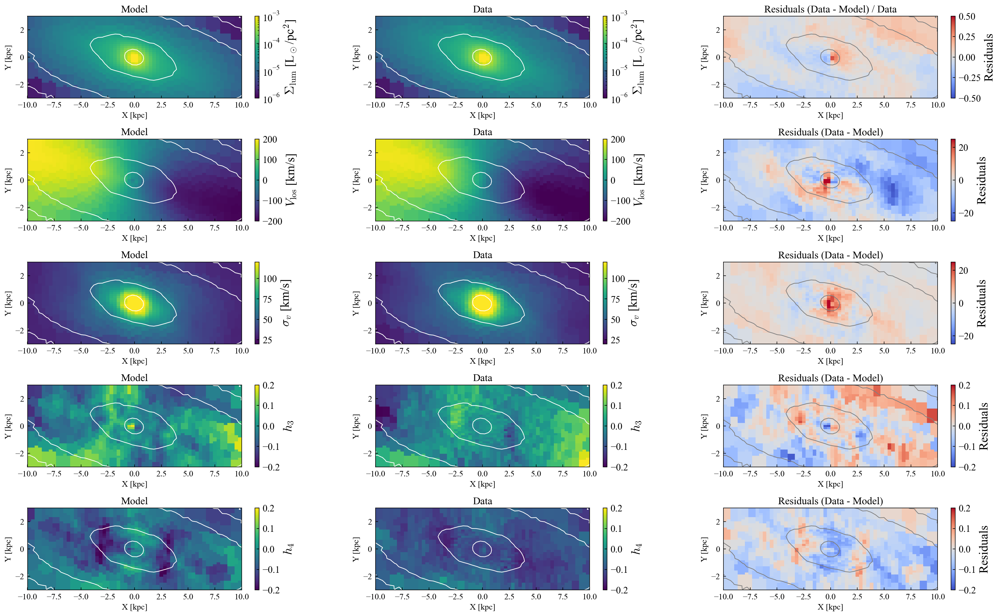

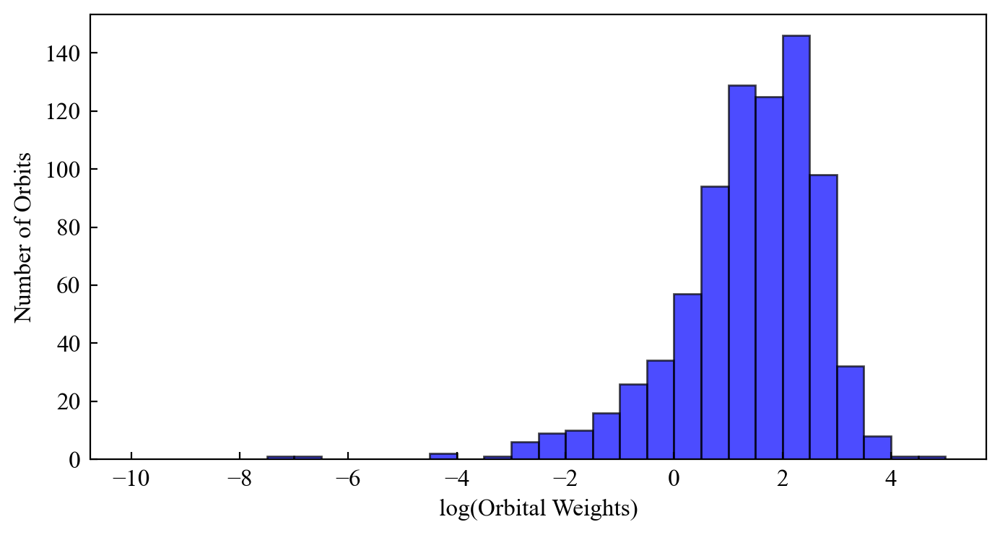

In [9]:
# the following commands make plots look better
def plot_prettier(dpi=200, fontsize=12, usetex=False):
    '''
    Make plots look nicer compared to Matplotlib defaults
    Parameters:
        dpi - int, "dots per inch" - controls resolution of PNG images that are produced
                by Matplotlib
        fontsize - int, font size to use overall
        usetex - bool, whether to use LaTeX to render fonds of axes labels
                use False if you don't have LaTeX installed on your system
    '''
    plt.rcParams['figure.dpi']= dpi
    plt.rc("savefig", dpi=dpi)
    plt.rc('font', size=fontsize)
    plt.rc('xtick', direction='in')
    plt.rc('ytick', direction='in')
    plt.rc('xtick.major', pad=5)
    plt.rc('xtick.minor', pad=5)
    plt.rc('ytick.major', pad=5)
    plt.rc('ytick.minor', pad=5)
    plt.rc('lines', dotted_pattern = [2., 2.])
    # if you don't have LaTeX installed on your laptop and this statement
    # generates error, comment it out
    plt.rc('text', usetex=usetex)
    #fm.fontManager.addfont('Serif.ttf')
    plt.rcParams['mathtext.fontset'] = 'cm'
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plot_prettier(usetex=False)


def bar_angle_bar_strength(x, y, R_anulus = np.arange(1,5,0.25)):

    ''' 
    Calculate the angle and strength of the dipole strength in each radial bin.
    Parameters:
        x, y - ndarray, Cartesian coordinates of the stars
        R_anulus - ndarray, edges of the radial bins to use for calculating the dipole angle and strength
    Returns:
        R_mid - ndarray, midpoints of the radial bins
        bar_angles0 - ndarray, angles of the dipole strength in each radial bin
        bar_strength0 - ndarray, strengths of the dipole strength in each radial bin

    '''

    R0,phi0 = np.sqrt(x**2 + y**2), np.arctan2(y,x)

    bar_angles0 = []
    bar_strength0 = []
    R_anulus = R_anulus
    for i in range(len(R_anulus)-1):
        sel0 = (R0>R_anulus[i]) & (R0<R_anulus[i+1])

        r_min_i = (R_anulus[i]+R_anulus[i+1])/2
        
        R0_bin, phi0_bin = R0[sel0], phi0[sel0]

        A2_0 = np.sum(np.cos(2*phi0_bin))/len(phi0_bin)
        B2_0 = np.sum(np.sin(2*phi0_bin))/len(phi0_bin)

        angle_bar0 = 0.5*np.arctan2(B2_0,A2_0)
        bar_strength = np.sqrt(A2_0**2 + B2_0**2)

        bar_angles0.append(angle_bar0)
        bar_strength0.append(bar_strength
                             )
    R_mid = (R_anulus[:-1]+R_anulus[1:])/2
    bar_angles0 = np.array(bar_angles0)
    bar_strength0 = np.array(bar_strength0)

    return R_mid, bar_angles0, bar_strength0

def rotate(posvel, angle):
    # Rotate contourclockwise with positive angle
    x, y, z, vx, vy, vz = posvel.T
    sina, cosa = np.sin(angle), np.cos(angle)
    return np.array([x*cosa-y*sina, x*sina+y*cosa, z, vx*cosa-vy*sina, vx*sina+vy*cosa, vz]).T


from astropy import units as u
from astropy.constants import G

mass_unit = 1/((G*u.Msun).to(u.kpc*(u.km/u.s)**2))
w0_data, mass_data = agama.readSnapshot(data_folder + '/Bar_model_TG21/model/t_t0_2.5')
mass_data = mass_data * mass_unit.value

mask = (mass_data!=np.unique(mass_data)[-1])
w0_data = w0_data[mask]
mass_data = mass_data[mask]

w0_data[:,0] = w0_data[:,0] - np.mean(w0_data[:,0])
w0_data[:,1] = w0_data[:,1] - np.mean(w0_data[:,1])
w0_data[:,2] = w0_data[:,2] - np.mean(w0_data[:,2])
w0_data[:,3] = w0_data[:,3] - np.mean(w0_data[:,3])
w0_data[:,4] = w0_data[:,4] - np.mean(w0_data[:,4])
w0_data[:,5] = w0_data[:,5] - np.mean(w0_data[:,5])

w0_data[:,0] = -w0_data[:,0]
w0_data[:,3] = -w0_data[:,3]

R_mid, bar_angles0, bar_strength0 = bar_angle_bar_strength(w0_data[:,0], w0_data[:,1], R_anulus = np.arange(1,5,0.25))
bar_angle0 = np.mean(bar_angles0[R_mid<4])
rot_angle = -bar_angle0
w0_data = rotate(w0_data, rot_angle)  # rotate to make it anticlockwise


alpha, beta, gamma = 30, 20, 140
rot_mat = makeRotationMatrix(alpha, beta, gamma)
x_data, v_data = w0_data[:,:3], w0_data[:,3:]
x_data = (rot_mat @ x_data.T).T
v_data = (rot_mat @ v_data.T).T
w0_data[:,:3] = x_data
w0_data[:,3:] = v_data
x, y = w0_data[:, 0], w0_data[:, 1]
R, phi = np.sqrt(w0_data[:, 0]**2 + w0_data[:, 1]**2), np.arctan2(w0_data[:, 1], w0_data[:, 0])
z, vy = w0_data[:, 2], w0_data[:, 4]
XY_stars = np.stack([x, z], axis=-1) # prefect edge-on view

X_min, X_max = -12., 12.
Y_min, Y_max = -4., 4.
nX, nY = 60,40
area_XY = ((X_max - X_min)/nX) * ((Y_max - Y_min)/nY)
X_edge = jnp.linspace(X_min, X_max, nX+1)
Y_edge = jnp.linspace(Y_min, Y_max, nY+1)
X_mids, Y_mids = 0.5 * (X_edge[:-1] + X_edge[1:]), 0.5 * (Y_edge[:-1] + Y_edge[1:])
H, xedge, yedge = np.histogram2d(XY_stars[:, 0], XY_stars[:, 1], bins=[X_edge, Y_edge])
signal = H.flatten()
noise = np.sqrt(signal + 1)
xmid, ymid = 0.5 * (xedge[1:] + xedge[:-1]), 0.5 * (yedge[1:] + yedge[:-1])


bin_mapping = dict_data['bin_mapping']
index_remap = bin_mapping[:-1]


density_2DXY, y_xy, sig_xy = density_set
h1_model, y_h1, sig_A1 = h1_set
h2_model, y_h2, sig_A2 = h2_set
h3_model, y_h3, sig_A3 = h3_set
h4_model, y_h4, sig_A4 = h4_set


index_remap = bin_mapping[:-1]

density_2DXY_weighted = density_2DXY[index_remap]
V_model_weighted = V_model[index_remap]
sigma_model_weighted = sigma_model[index_remap]
h1_model_weighted = h1_model[index_remap]
h2_model_weighted = h2_model[index_remap]
h3_model_weighted = h3_model[index_remap]
h4_model_weighted = h4_model[index_remap]

surface_density = dict_data['XY_density_data']
V_data = dict_data['V_data']
sigma_data = dict_data['sigma_data']
h1_data = dict_data['h1_data']
h2_data = dict_data['h2_data']
h3_data = dict_data['h3_data']
h4_data = dict_data['h4_data']
X_regular_grid = dict_data['X_regular_grid']
Y_regular_grid = dict_data['Y_regular_grid']

density_2DXY_data = y_xy[index_remap]
V_model_data = V_data[index_remap]
sigma_model_data = sigma_data[index_remap]
h1_model_data = y_h1[index_remap]
h2_model_data = y_h2[index_remap]
h3_model_data = y_h3[index_remap]
h4_model_data = y_h4[index_remap]

model_batch = (density_2DXY_weighted, V_model_weighted, sigma_model_weighted, h3_model_weighted, h4_model_weighted)
data_batch = (density_2DXY_data, V_model_data, sigma_model_data, h3_model_data, h4_model_data)

fig_names = [r'$\Sigma_{\rm lum}$ [L$_\odot$/pc$^2$]', r'$V_{\rm los}$ [km/s]', r'$\sigma_{v}$ [km/s]', r'$h_3$', r'$h_4$']
fig_names_save = ['Surface_density', 'V_los', 'Sigma_V', 'h3', 'h4']
vmin_ls = [1e-6, -200, 20, -0.2, -0.2]
vmax_ls = [1e-3, 200, 120, 0.2, 0.2]
vminmax_ls = [0.5, 25, 25, 0.2, 0.2]

fig1, ax1 = plt.subplots(len(model_batch),3, figsize = (25,3 * len(model_batch)), gridspec_kw={'hspace':0.5, 'wspace':0.3})

for i in range(len(model_batch)):
    
    # fig0, ax0 = plt.subplots(1,3, figsize = (25,3), gridspec_kw={'hspace':0.5, 'wspace':0.3})
    
    # cb = ax0[0].scatter(X_regular_grid, Y_regular_grid, c=model_batch[i],
    #                 s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
    #                 vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    # ax0[0].set_title(f'Model', fontsize=15)
    # ax0[0].set_xlabel('X [kpc]', fontsize=12)
    # ax0[0].set_ylabel('Y [kpc]', fontsize=12)
    # ax0[0].set_xlim(-12, 12)
    # ax0[0].set_ylim(-4, 4)
    # cbar = fig0.colorbar(cb, ax=ax0[0])
    # cbar.set_label(fig_names[i], fontsize=18)
    # cbar.ax.tick_params(labelsize=14)

    # cb = ax0[1].scatter(X_regular_grid, Y_regular_grid, c=data_batch[i],
    #                 s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
    #                 vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    # ax0[1].set_title(f'Data', fontsize=15)
    # ax0[1].set_xlabel('X [kpc]', fontsize=12)
    # ax0[1].set_ylabel('Y [kpc]', fontsize=12)
    # ax0[1].set_xlim(-12, 12)
    # ax0[1].set_ylim(-4, 4)
    # cbar = fig0.colorbar(cb, ax=ax0[1])
    # cbar.set_label(fig_names[i], fontsize=18)
    # cbar.ax.tick_params(labelsize=14)

    # res = (data_batch[i] - model_batch[i]) / data_batch[i] if i == 0 else (data_batch[i] - model_batch[i])
    # cb = ax0[2].scatter(X_regular_grid, Y_regular_grid, c=res,
    #                 s = 22, cmap='coolwarm', marker = 's', vmin = -vminmax_ls[i], vmax = vminmax_ls[i], rasterized = True)
    # ax0[2].set_title('Residuals (Data - Model) / Data' if i == 0 else 'Residuals (Data - Model)', fontsize=15)
    # ax0[2].set_xlabel('X [kpc]', fontsize=12)
    # ax0[2].set_ylabel('Y [kpc]', fontsize=12)
    # ax0[2].set_xlim(-12, 12)
    # ax0[2].set_ylim(-4, 4)
    # cbar = fig0.colorbar(cb, ax=ax0[2])
    # cbar.set_label('Residuals', fontsize=18)
    # cbar.ax.tick_params(labelsize=14)

    # for j in range (0,3):
    #     ax0[j].contour(xmid, ymid, np.log10(H).T, levels=5, colors='white' if j!=2 else 'grey', linewidths=1)

    # fig0.savefig(f'/data/hz420-2/SchwarMAX/plots/Mock_disc_bulge_{fig_names_save[i]}.png', bbox_inches='tight', dpi=300)

    cb = ax1[i][0].scatter(X_regular_grid, Y_regular_grid, c=model_batch[i],
                    s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
                    vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    ax1[i][0].set_title(f'Model', fontsize=15)
    ax1[i][0].set_xlabel('X [kpc]', fontsize=12)
    ax1[i][0].set_ylabel('Y [kpc]', fontsize=12)
    ax1[i][0].set_xlim(-10, 10)
    ax1[i][0].set_ylim(-3, 3)
    cbar = fig1.colorbar(cb, ax=ax1[i][0])
    cbar.set_label(fig_names[i], fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    cb = ax1[i][1].scatter(X_regular_grid, Y_regular_grid, c=data_batch[i],
                    s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
                    vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    ax1[i][1].set_title(f'Data', fontsize=15)
    ax1[i][1].set_xlabel('X [kpc]', fontsize=12)
    ax1[i][1].set_ylabel('Y [kpc]', fontsize=12)
    ax1[i][1].set_xlim(-10, 10)
    ax1[i][1].set_ylim(-3, 3)
    cbar = fig1.colorbar(cb, ax=ax1[i][1])
    cbar.set_label(fig_names[i], fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    res = (data_batch[i] - model_batch[i]) / data_batch[i] if i == 0 else (data_batch[i] - model_batch[i])
    cb = ax1[i][2].scatter(X_regular_grid, Y_regular_grid, c=res,
                    s = 22, cmap='coolwarm', marker = 's', vmin = -vminmax_ls[i], vmax = vminmax_ls[i], rasterized = True)
    ax1[i][2].set_title('Residuals (Data - Model) / Data' if i == 0 else 'Residuals (Data - Model)', fontsize=15)
    ax1[i][2].set_xlabel('X [kpc]', fontsize=12)
    ax1[i][2].set_ylabel('Y [kpc]', fontsize=12)
    ax1[i][2].set_xlim(-10, 10)
    ax1[i][2].set_ylim(-3, 3)
    cbar = fig1.colorbar(cb, ax=ax1[i][2])
    cbar.set_label('Residuals', fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    for j in range (0,3):
        ax1[i][j].contour(xmid, ymid, np.log10(H).T, levels=5, colors='white' if j!=2 else 'grey', linewidths=1)

fig1.savefig(f'{data_folder}/plots/Mock_bar_allin1.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1,1, figsize=(8,4))
ax.hist(jnp.log(weights), range = [-10, 5], bins=30, alpha=0.7, color='blue', edgecolor='black')
ax.set_xlabel('log(Orbital Weights)', fontsize=12)
ax.set_ylabel('Number of Orbits', fontsize=12)
plt.show()

/var/folders/sy/hx8cmv810rq7tfr6nkmnhg3w0000gn/T/ipykernel_91527/1146512485.py:235: RuntimeWarning: divide by zero encountered in log10
  ax1[i][j].contour(xmid, ymid, np.log10(H).T, levels=5, colors='white' if j!=2 else 'grey', linewidths=1)


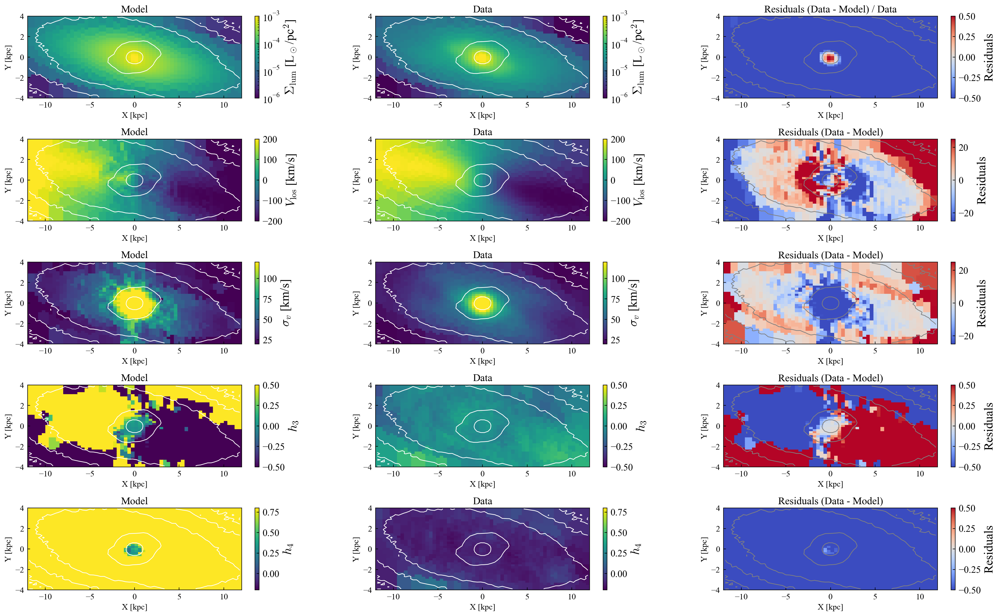

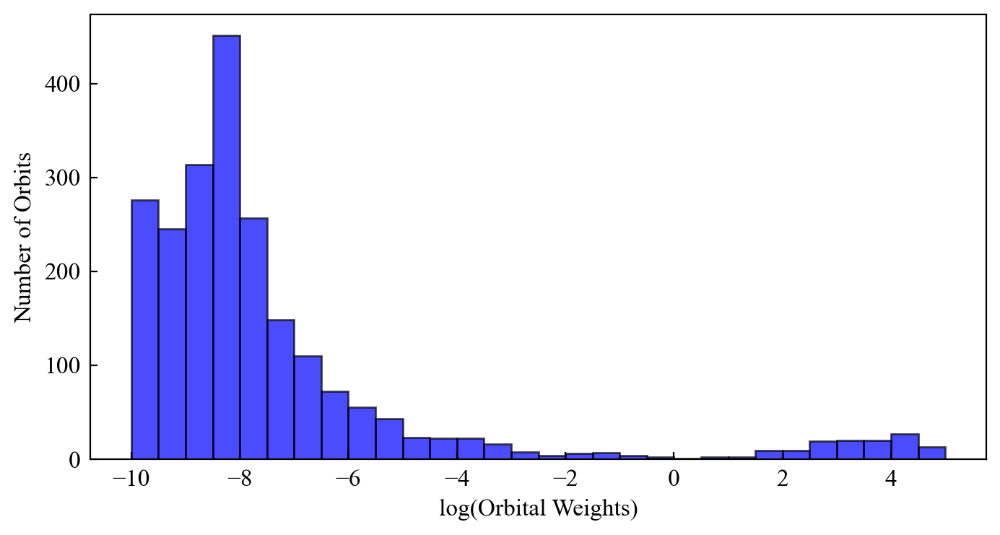

In [20]:
# the following commands make plots look better
def plot_prettier(dpi=200, fontsize=12, usetex=False):
    '''
    Make plots look nicer compared to Matplotlib defaults
    Parameters:
        dpi - int, "dots per inch" - controls resolution of PNG images that are produced
                by Matplotlib
        fontsize - int, font size to use overall
        usetex - bool, whether to use LaTeX to render fonds of axes labels
                use False if you don't have LaTeX installed on your system
    '''
    plt.rcParams['figure.dpi']= dpi
    plt.rc("savefig", dpi=dpi)
    plt.rc('font', size=fontsize)
    plt.rc('xtick', direction='in')
    plt.rc('ytick', direction='in')
    plt.rc('xtick.major', pad=5)
    plt.rc('xtick.minor', pad=5)
    plt.rc('ytick.major', pad=5)
    plt.rc('ytick.minor', pad=5)
    plt.rc('lines', dotted_pattern = [2., 2.])
    # if you don't have LaTeX installed on your laptop and this statement
    # generates error, comment it out
    plt.rc('text', usetex=usetex)
    #fm.fontManager.addfont('Serif.ttf')
    plt.rcParams['mathtext.fontset'] = 'cm'
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plot_prettier(usetex=False)


from astropy import units as u
from astropy.constants import G

mass_unit = 1/((G*u.Msun).to(u.kpc*(u.km/u.s)**2))
w0_data, mass_data = agama.readSnapshot(data_folder + '/Bar_model_TG21/model/t_t0_2.5')
mass_data = mass_data * mass_unit.value

mask = (mass_data!=np.unique(mass_data)[-1])
w0_data = w0_data[mask]
mass_data = mass_data[mask]

w0_data[:,0] = w0_data[:,0] - np.mean(w0_data[:,0])
w0_data[:,1] = w0_data[:,1] - np.mean(w0_data[:,1])
w0_data[:,2] = w0_data[:,2] - np.mean(w0_data[:,2])
w0_data[:,3] = w0_data[:,3] - np.mean(w0_data[:,3])
w0_data[:,4] = w0_data[:,4] - np.mean(w0_data[:,4])
w0_data[:,5] = w0_data[:,5] - np.mean(w0_data[:,5])

w0_data[:,0] = -w0_data[:,0]
w0_data[:,3] = -w0_data[:,3]

alpha, beta, gamma = 30, 20, 130
rot_mat = makeRotationMatrix(alpha, beta, gamma)
x_data, v_data = w0_data[:,:3], w0_data[:,3:]
x_data = (rot_mat @ x_data.T).T
v_data = (rot_mat @ v_data.T).T
w0_data[:,:3] = x_data
w0_data[:,3:] = v_data
x, y = w0_data[:, 0], w0_data[:, 1]
R, phi = np.sqrt(w0_data[:, 0]**2 + w0_data[:, 1]**2), np.arctan2(w0_data[:, 1], w0_data[:, 0])
z, vy = w0_data[:, 2], w0_data[:, 4]
XY_stars = np.stack([x, z], axis=-1) # prefect edge-on view

X_min, X_max = -12., 12.
Y_min, Y_max = -4., 4.
nX, nY = 60,40
area_XY = ((X_max - X_min)/nX) * ((Y_max - Y_min)/nY)
X_edge = jnp.linspace(X_min, X_max, nX+1)
Y_edge = jnp.linspace(Y_min, Y_max, nY+1)
X_mids, Y_mids = 0.5 * (X_edge[:-1] + X_edge[1:]), 0.5 * (Y_edge[:-1] + Y_edge[1:])
H, xedge, yedge = np.histogram2d(XY_stars[:, 0], XY_stars[:, 1], bins=[X_edge, Y_edge])
signal = H.flatten()
noise = np.sqrt(signal + 1)
xmid, ymid = 0.5 * (xedge[1:] + xedge[:-1]), 0.5 * (yedge[1:] + yedge[:-1])


@jax.jit
def density_func(R, z, phi, params):
    x = R * jnp.cos(phi)
    y = R * jnp.sin(phi)
    return DoubleExponentialDisk_density(x, y, z, params)

@partial(jax.jit, static_argnames=['rho_fct'])
def get_mass(R_grid, z_grid, phi_grid, rho_fct, dict_params, dR, dz, dphi, sample):
    R_samples = R_grid + (sample[:,0] - 0.5) * dR
    z_samples = z_grid + (sample[:,1] - 0.5) * dz
    phi_samples = phi_grid + (sample[:,2] - 0.5) * dphi
    density_samples = rho_fct(R_samples, z_samples, phi_samples, dict_params)
    mass_tot = jnp.sum(density_samples * R_samples) / sample.shape[0]
    return mass_tot

R_grid, dR = dict_data['R_grid'], dict_data['dR']
z_grid, dz = dict_data['z_grid'], dict_data['dz']
phi_grid, dphi = dict_data['phi_grid'], dict_data['dphi']
Rzphi_density_data = jax.vmap(get_mass, in_axes=[0, 0, 0, None, None, None, None, None, None])(
            R_grid, z_grid, phi_grid, density_func, params_disk_rho, dR, dz, dphi, dict_data['sample_for_integration']
)
bin_mapping = dict_data['bin_mapping']
mean_mass_per_orb = jnp.sum(Rzphi_density_data) / len(weights)
index_remap = bin_mapping[:-1]


density_2DXY, y_xy, sig_xy = density_unity_set
h1_model, y_h1, sig_A1 = h1_unity_set
h2_model, y_h2, sig_A2 = h2_unity_set
h3_model, y_h3, sig_A3 = h3_unity_set
h4_model, y_h4, sig_A4 = h4_unity_set

mean_mass_per_orb = jnp.sum(Rzphi_density_data) / len(weights)
index_remap = bin_mapping[:-1]

density_2DXY_weighted = density_2DXY[index_remap]
V_model_weighted = V_model[index_remap]
sigma_model_weighted = sigma_model[index_remap]
h1_model_weighted = h1_model[index_remap]
h2_model_weighted = h2_model[index_remap]
h3_model_weighted = h3_model[index_remap]
h4_model_weighted = h4_model[index_remap]

surface_density = dict_data['XY_density_data']
V_data = dict_data['V_data']
sigma_data = dict_data['sigma_data']
h1_data = dict_data['h1_data']
h2_data = dict_data['h2_data']
h3_data = dict_data['h3_data']
h4_data = dict_data['h4_data']
X_regular_grid = dict_data['X_regular_grid']
Y_regular_grid = dict_data['Y_regular_grid']

density_2DXY_data = y_xy[index_remap]
V_model_data = V_data[index_remap]
sigma_model_data = sigma_data[index_remap]
h1_model_data = y_h1[index_remap]
h2_model_data = y_h2[index_remap]
h3_model_data = y_h3[index_remap]
h4_model_data = y_h4[index_remap]

# density_2DXY_data = density_2DXY_data / mean_mass_per_orb
# density_2DXY_weighted = density_2DXY_weighted * 10**0.3

model_batch = (density_2DXY_weighted, V_model_weighted, sigma_model_weighted, h3_model_weighted, h4_model_weighted)
data_batch = (density_2DXY_data, V_model_data, sigma_model_data, h3_model_data, h4_model_data)

fig_names = [r'$\Sigma_{\rm lum}$ [L$_\odot$/pc$^2$]', r'$V_{\rm los}$ [km/s]', r'$\sigma_{v}$ [km/s]', r'$h_3$', r'$h_4$']
fig_names_save = ['Surface_density', 'V_los', 'Sigma_V', 'h3', 'h4']
vmin_ls = [1e-6, -200, 20, -0.5, -0.2]
vmax_ls = [1e-3, 200, 120, 0.5, 0.8]
vminmax_ls = [0.5, 25, 25, 0.5, 0.5]

fig1, ax1 = plt.subplots(len(model_batch),3, figsize = (25,3 * len(model_batch)), gridspec_kw={'hspace':0.5, 'wspace':0.3})

for i in range(len(model_batch)):
    
    # fig0, ax0 = plt.subplots(1,3, figsize = (25,3), gridspec_kw={'hspace':0.5, 'wspace':0.3})
    
    # cb = ax0[0].scatter(X_regular_grid, Y_regular_grid, c=model_batch[i],
    #                 s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
    #                 vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    # ax0[0].set_title(f'Model', fontsize=15)
    # ax0[0].set_xlabel('X [kpc]', fontsize=12)
    # ax0[0].set_ylabel('Y [kpc]', fontsize=12)
    # ax0[0].set_xlim(-12, 12)
    # ax0[0].set_ylim(-4, 4)
    # cbar = fig0.colorbar(cb, ax=ax0[0])
    # cbar.set_label(fig_names[i], fontsize=18)
    # cbar.ax.tick_params(labelsize=14)

    # cb = ax0[1].scatter(X_regular_grid, Y_regular_grid, c=data_batch[i],
    #                 s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
    #                 vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    # ax0[1].set_title(f'Data', fontsize=15)
    # ax0[1].set_xlabel('X [kpc]', fontsize=12)
    # ax0[1].set_ylabel('Y [kpc]', fontsize=12)
    # ax0[1].set_xlim(-12, 12)
    # ax0[1].set_ylim(-4, 4)
    # cbar = fig0.colorbar(cb, ax=ax0[1])
    # cbar.set_label(fig_names[i], fontsize=18)
    # cbar.ax.tick_params(labelsize=14)

    # res = (data_batch[i] - model_batch[i]) / data_batch[i] if i == 0 else (data_batch[i] - model_batch[i])
    # cb = ax0[2].scatter(X_regular_grid, Y_regular_grid, c=res,
    #                 s = 22, cmap='coolwarm', marker = 's', vmin = -vminmax_ls[i], vmax = vminmax_ls[i], rasterized = True)
    # ax0[2].set_title('Residuals (Data - Model) / Data' if i == 0 else 'Residuals (Data - Model)', fontsize=15)
    # ax0[2].set_xlabel('X [kpc]', fontsize=12)
    # ax0[2].set_ylabel('Y [kpc]', fontsize=12)
    # ax0[2].set_xlim(-12, 12)
    # ax0[2].set_ylim(-4, 4)
    # cbar = fig0.colorbar(cb, ax=ax0[2])
    # cbar.set_label('Residuals', fontsize=18)
    # cbar.ax.tick_params(labelsize=14)

    # for j in range (0,3):
    #     ax0[j].contour(xmid, ymid, np.log10(H).T, levels=5, colors='white' if j!=2 else 'grey', linewidths=1)

    # fig0.savefig(f'/data/hz420-2/SchwarMAX/plots/Mock_disc_bulge_{fig_names_save[i]}.png', bbox_inches='tight', dpi=300)

    cb = ax1[i][0].scatter(X_regular_grid, Y_regular_grid, c=model_batch[i],
                    s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
                    vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    ax1[i][0].set_title(f'Model', fontsize=15)
    ax1[i][0].set_xlabel('X [kpc]', fontsize=12)
    ax1[i][0].set_ylabel('Y [kpc]', fontsize=12)
    ax1[i][0].set_xlim(-12, 12)
    ax1[i][0].set_ylim(-4, 4)
    cbar = fig1.colorbar(cb, ax=ax1[i][0])
    cbar.set_label(fig_names[i], fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    cb = ax1[i][1].scatter(X_regular_grid, Y_regular_grid, c=data_batch[i],
                    s = 22, cmap='viridis', marker = 's', norm = 'log' if i == 0 else None,
                    vmin = vmin_ls[i], vmax = vmax_ls[i], rasterized = True)
    ax1[i][1].set_title(f'Data', fontsize=15)
    ax1[i][1].set_xlabel('X [kpc]', fontsize=12)
    ax1[i][1].set_ylabel('Y [kpc]', fontsize=12)
    ax1[i][1].set_xlim(-12, 12)
    ax1[i][1].set_ylim(-4, 4)
    cbar = fig1.colorbar(cb, ax=ax1[i][1])
    cbar.set_label(fig_names[i], fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    res = (data_batch[i] - model_batch[i]) / data_batch[i] if i == 0 else (data_batch[i] - model_batch[i])
    cb = ax1[i][2].scatter(X_regular_grid, Y_regular_grid, c=res,
                    s = 22, cmap='coolwarm', marker = 's', vmin = -vminmax_ls[i], vmax = vminmax_ls[i], rasterized = True)
    ax1[i][2].set_title('Residuals (Data - Model) / Data' if i == 0 else 'Residuals (Data - Model)', fontsize=15)
    ax1[i][2].set_xlabel('X [kpc]', fontsize=12)
    ax1[i][2].set_ylabel('Y [kpc]', fontsize=12)
    ax1[i][2].set_xlim(-12, 12)
    ax1[i][2].set_ylim(-4, 4)
    cbar = fig1.colorbar(cb, ax=ax1[i][2])
    cbar.set_label('Residuals', fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    for j in range (0,3):
        ax1[i][j].contour(xmid, ymid, np.log10(H).T, levels=5, colors='white' if j!=2 else 'grey', linewidths=1)

# fig1.savefig(f'{data_folder}/plots/Mock_bar_allin1.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1,1, figsize=(8,4))
ax.hist(jnp.log(weights), range = [-10, 5], bins=30, alpha=0.7, color='blue', edgecolor='black')
ax.set_xlabel('log(Orbital Weights)', fontsize=12)
ax.set_ylabel('Number of Orbits', fontsize=12)
plt.show()